In [1]:
import numpy as np
import torch
from torch import nn  
import math
import time 
import os  
import xarray as xr
import subprocess
import matplotlib.pyplot as plt
from matplotlib import colors
import cartopy.crs as ccrs

In [2]:
## import self defined functions
from sys import path 
# insert at 1, 0 is the script path (or '' in REPL)
path.insert(1, '/tigress/cw55/local/python_lib')
from cg_funcs import global_mean_xarray
root = '/tigress/cw55/work/2022_radi_nn' 

In [3]:
from get_data_sw_AM4_std import get_data_sw_AM4
######################################################
# common functions to split the training and test data
from NNRTMC_utils import NNRTMC_NN_sw, split_train_test_sample, \
draw_batches, data_std_normalization_sw,  return_exp_dir
torch.set_float32_matmul_precision('high')

from diag_utils import batch_index_sta_end, pred_NN_batch_sw,\
create_6tiles_sw,regrid_6tile2latlon

In [4]:
plt.rcParams['font.size'] = '6'

In [5]:
# torch.cuda.set_device(0) # select gpu_id, default 0 means the first GPU
# device = f'cuda:{torch.cuda.current_device()}'
device = 'cpu'
######################################################
# set exp name and runs
Exp_name = [
    'ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811'    ,
    'ens_AM4std_sw_all_LiH4W256Relu_EY_D25811'   ,
    'ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811'    ,
    'ens_AM4std_sw_all_LiH4W256Relu_EN_D25811'   ,
] 
sky_cond = {
    'ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811'    : 'cs',
    'ens_AM4std_sw_all_LiH4W256Relu_EY_D25811'   : 'all',
    'ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811'    : 'cs',
    'ens_AM4std_sw_all_LiH4W256Relu_EN_D25811'   : 'all',
}
work_dir = root+'/work/' 
# file list AM4 runs 
filelist = [f'/scratch/gpfs/cw55/AM4/work/CTL2000_train_y2000_stellarcpu_intelmpi_22_768PE/'+
            f'HISTORY/20000101.atmos_8xdaily.tile{_}.nc' for _ in range(1,7)] 
hybrid_p_sigma_para = xr.open_dataset('/tigress/cw55/data/NNRTMC_dataset/AM4_pk_bk_202207.nc')
A_k = hybrid_p_sigma_para.ak.values[None,:]
B_k = hybrid_p_sigma_para.bk.values[None,:] 

In [6]:
month_sel = None
day_sel = [15,18,21,24,27]
day_sel = [2,5,8,11] #train

# Plot Loss

In [7]:
ensemble_size = 3 
loss_array = {}
for mo in Exp_name:
    loss_array[mo] = []
    for ei in range(ensemble_size):
        ######################################################
        # load restart file
        run_num, exp_dir = return_exp_dir(work_dir, mo, create_dir=False)
        # load restart file
        PATH_last =  exp_dir+f'/model{ei}_restart.{run_num-1:02d}.pth'
        restart_data = torch.load(PATH_last)  # load exist results and restart training
        print(f'load: {PATH_last}')
        # read training dataset, nor_para, model parameteres
        loss_array[mo].append(restart_data['loss_array'])

load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/model0_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/model1_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/model2_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/model0_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/model1_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/model2_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/model0_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/model1_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/model2_restart.03.pth
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4st

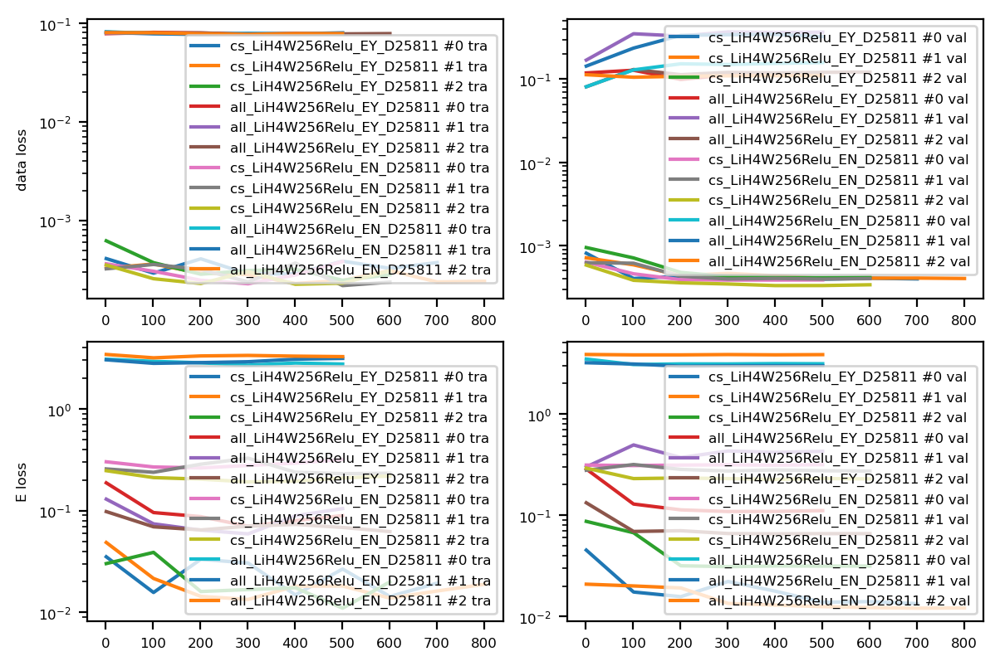

In [8]:
fig, axs = plt.subplots(nrows=2, ncols=2, figsize=(6,4),dpi=200, tight_layout=True)  
axs = axs.flatten()
for mo in Exp_name:
    for ei in range(ensemble_size):
        epochs  = loss_array[mo][ei][0]
        LD_tra  = loss_array[mo][ei][1]
        LE_tra  = loss_array[mo][ei][2]
        LD_val  = loss_array[mo][ei][3]
        LE_val  = loss_array[mo][ei][4]
        axs[0].plot(epochs,LD_tra, label = f'{mo[14:]} #{ei} tra')
        axs[1].plot(epochs,LD_val, label = f'{mo[14:]} #{ei} val')
        axs[2].plot(epochs,LE_tra, label = f'{mo[14:]} #{ei} tra')
        axs[3].plot(epochs,LE_val, label = f'{mo[14:]} #{ei} val')
for ax in axs:
    ax.set_yscale('log')
    ax.legend()
axs[0].set_ylabel('data loss')
axs[2].set_ylabel('E loss')
fig.show()

In [9]:
for mo in Exp_name:
    for ei in range(ensemble_size):
        epochs  = loss_array[mo][ei][0]
        LD_tra  = loss_array[mo][ei][1]
        LE_tra  = loss_array[mo][ei][2]
        LD_val  = loss_array[mo][ei][3]
        LE_val  = loss_array[mo][ei][4]
        print(mo)
        for epi,ep in enumerate(epochs):
            print(f'{ep:4.0f} tra {LD_tra[epi]:8.2e} {LE_tra[epi]:8.2e} val {LD_val[epi]:8.2e} {LE_val[epi]:8.2e} ')

ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811
   1 tra 4.10e-04 3.52e-02 val 8.12e-04 4.53e-02 
 101 tra 2.92e-04 1.57e-02 val 4.03e-04 1.75e-02 
 201 tra 4.08e-04 3.33e-02 val 4.30e-04 1.57e-02 
 301 tra 2.86e-04 3.06e-02 val 4.49e-04 2.22e-02 
 401 tra 2.87e-04 1.49e-02 val 4.19e-04 1.78e-02 
 501 tra 3.86e-04 2.67e-02 val 3.96e-04 1.39e-02 
 601 tra 3.27e-04 1.43e-02 val 4.07e-04 1.40e-02 
 701 tra 3.74e-04 1.94e-02 val 3.99e-04 1.34e-02 
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811
   1 tra 3.27e-04 4.87e-02 val 7.15e-04 2.09e-02 
 101 tra 3.62e-04 2.16e-02 val 5.89e-04 2.01e-02 
 201 tra 2.92e-04 1.44e-02 val 4.39e-04 1.92e-02 
 301 tra 2.82e-04 1.34e-02 val 4.65e-04 1.35e-02 
 401 tra 2.29e-04 1.81e-02 val 4.35e-04 1.30e-02 
 501 tra 2.46e-04 1.82e-02 val 4.05e-04 1.25e-02 
 601 tra 3.10e-04 1.38e-02 val 4.07e-04 1.23e-02 
 701 tra 2.38e-04 1.62e-02 val 4.08e-04 1.21e-02 
 801 tra 2.42e-04 1.89e-02 val 4.04e-04 1.22e-02 
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811
   1 tra 6.21e-04 3.02e-02 val

## load model

In [10]:
NN_model = {} 

for mo in Exp_name:
    NN_model[mo] = []
    for ei in range(ensemble_size):
        ######################################################
        run_num, exp_dir = return_exp_dir(work_dir, mo, create_dir=False)
        # load restart file
        PATH_last =  exp_dir+f'/model{ei}_restart.{run_num-1:02d}.pth'
        restart_data = torch.load(PATH_last)  # load exist results and restart training
        print(f'load: {PATH_last}')
        # read training dataset, nor_para, model parameteres
        nor_para = restart_data['nor_para']
        model_state_dict = restart_data['model_state_dict']
        nn_struc_name = list(restart_data['model_state_dict'].keys())
        input_size  = restart_data['model_state_dict'][nn_struc_name[0]].shape[1]
        output_size = restart_data['model_state_dict'][nn_struc_name[-1]].shape[0]
        hidden_layer_width = restart_data['model_state_dict'][nn_struc_name[0]].shape[0]
        print(input_size, output_size, hidden_layer_width,) 
        # initialize model 
        nn_model_ei = NNRTMC_NN_sw(device, nor_para, A_k, B_k, input_size, output_size, hidden_layer_width, model_state_dict)  
        NN_model[mo].append(nn_model_ei)

load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/model0_restart.03.pth
106 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/model1_restart.03.pth
106 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/model2_restart.03.pth
106 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/model0_restart.03.pth
370 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/model1_restart.03.pth
370 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/model2_restart.03.pth
370 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/model0_restart.03.pth
106 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/model1_restart.03.pth
106 36 256
load: /tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256R

In [11]:
# %%time  
recalculate = False
# recalculate = True
ds_regrid = {} 

for mo in Exp_name: 
    ds_regrid[mo] = [] 
    if (recalculate == True) :
    # read data
        input_array_ori, output_array_ori, rsdt_array_ori, ds_coords = \
        get_data_sw_AM4(filelist, condition=sky_cond[mo], 
                        month_sel = month_sel, day_sel = day_sel, return_coords=True) 
    for ei in range(ensemble_size):
        run_num, exp_dir = return_exp_dir(work_dir, mo, create_dir=False)
        NN_output_name = f'NN_{ei}_20000101.fluxes' 
        if (recalculate == True) :
        # pred with NN and regrid to lat lon grid.
            nor_para = NN_model[mo][ei].nor_para
            nor_para = {key: value.to('cpu').numpy() for key, value in nor_para.items()} 
            # normalize data via saved nor_para in restart file
            nor_para, input_array, output_array, rsdt_array, day_ind  \
            = data_std_normalization_sw(input_array_ori, output_array_ori, rsdt_array_ori, nor_para, remove_night=False)

            # try NN on test dataset  
            predi, eng_err = pred_NN_batch_sw(input_array, output_array, rsdt_array, NN_model[mo][ei], nor_para, device)
            error = predi - output_array_ori*rsdt_array_ori[:,None]
            predi[:,3:] = predi[:,3:]*86400 # HR K/s >> K/day
            error[:,3:] = error[:,3:]*86400 # HR K/s >> K/day 
            # create 6-tile files for output and regrid 
            subprocess.run([f'mkdir -p {exp_dir}/NN_pred'], shell=True, check=True)
            var_list = create_6tiles_sw(ds_coords, predi, error, eng_err,  exp_dir, NN_output_name)
            del predi, error, eng_err
            regrid_file_path = regrid_6tile2latlon(var_list, exp_dir, root, NN_output_name)
        regrid_file_path = exp_dir+f'/NN_pred/{NN_output_name}.nc'
        print(regrid_file_path)
        # open regridded file
        with  xr.open_dataset(regrid_file_path) as ds:
            ds_regrid[mo].append(ds.load().rename({'grid_yt':'lat', 'grid_xt':'lon'}))


/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_1_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_2_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/NN_pred/NN_1_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_all_LiH4W256Relu_EY_D25811/NN_pred/NN_2_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/NN_pred/NN_0_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/NN_pred/NN_1_20000101.fluxes.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811/NN_pred/NN_2_20000101.fluxes.nc
/tigress/cw55/wo

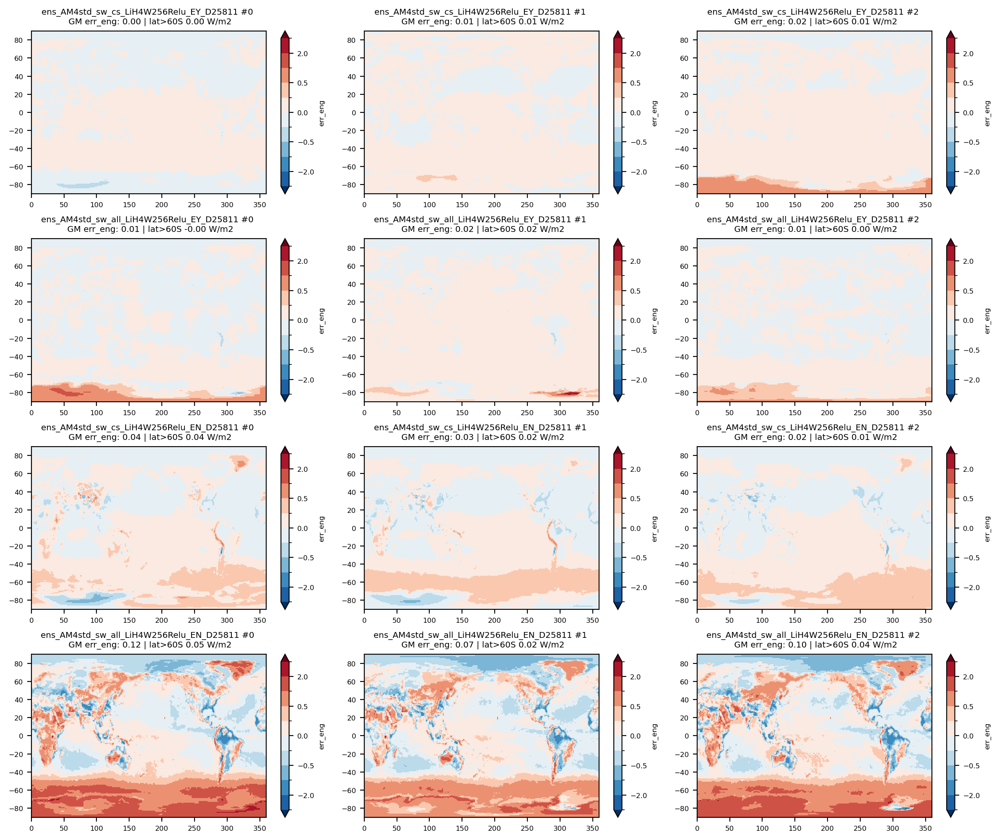

In [12]:
fig, axs = plt.subplots(nrows=len(Exp_name),ncols=ensemble_size,figsize=(4*ensemble_size,2.5*(len(Exp_name))),dpi=200)
axs = axs.flatten() 
for i, mo in enumerate(Exp_name):
    for ei in range(ensemble_size):
        ds_plot = ds_regrid[mo][ei]
        var_name = 'err_eng'
        level = np.array([-4,-2,-1,-0.5,-0.2,0,0.2,0.5,1,2,4 ])
        # level = np.arange(-5,5.1,0.5)
        # if sky_cond[mo] == 'all':  level = level*2
        ax=axs[i*ensemble_size+ei]
        da = ds_plot[var_name].mean('time')
        da.plot(ax=ax, levels=level, extend='both') 
        ax.set_title(f'{mo} #{ei} \n GM err_eng: {global_mean_xarray(da).values:4.2f} '
                     +f'| lat>60S {global_mean_xarray(da.sel(lat=slice(-60,None))).values:4.2f} W/m2') 
        ax.set(xlabel=None,ylabel=None) 
fig.tight_layout()

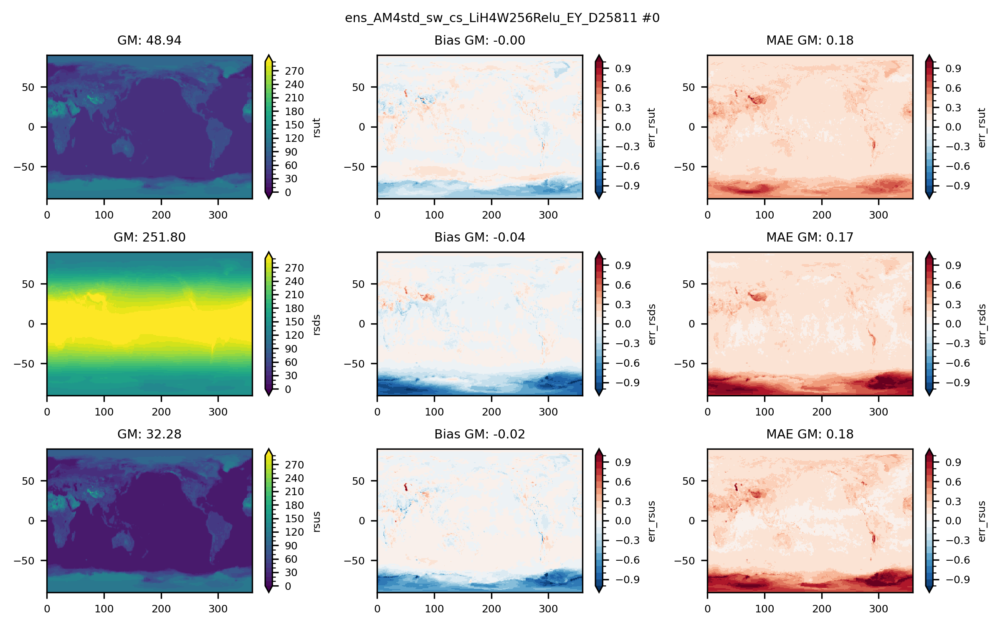

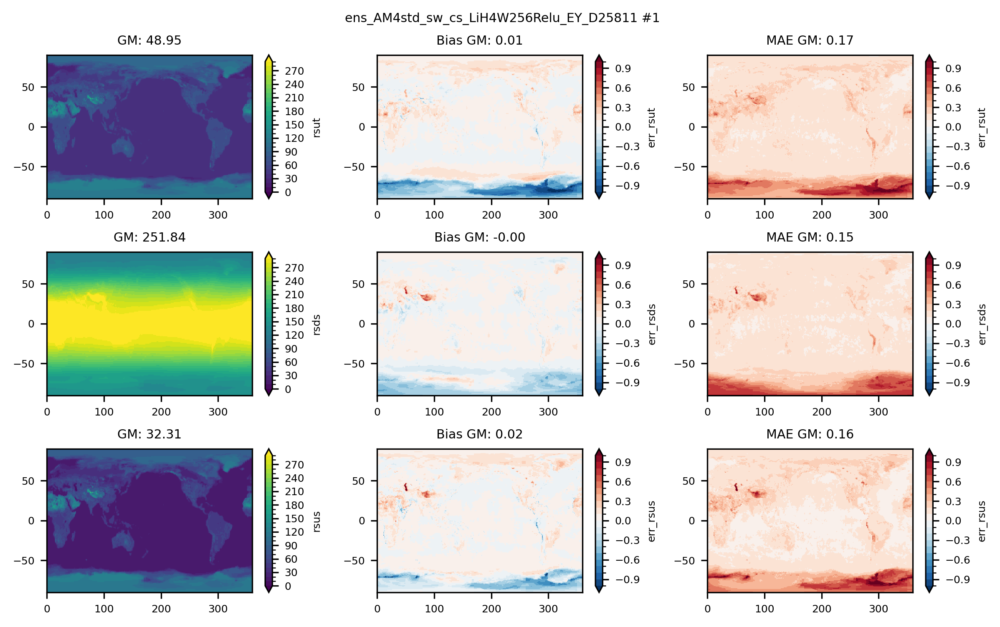

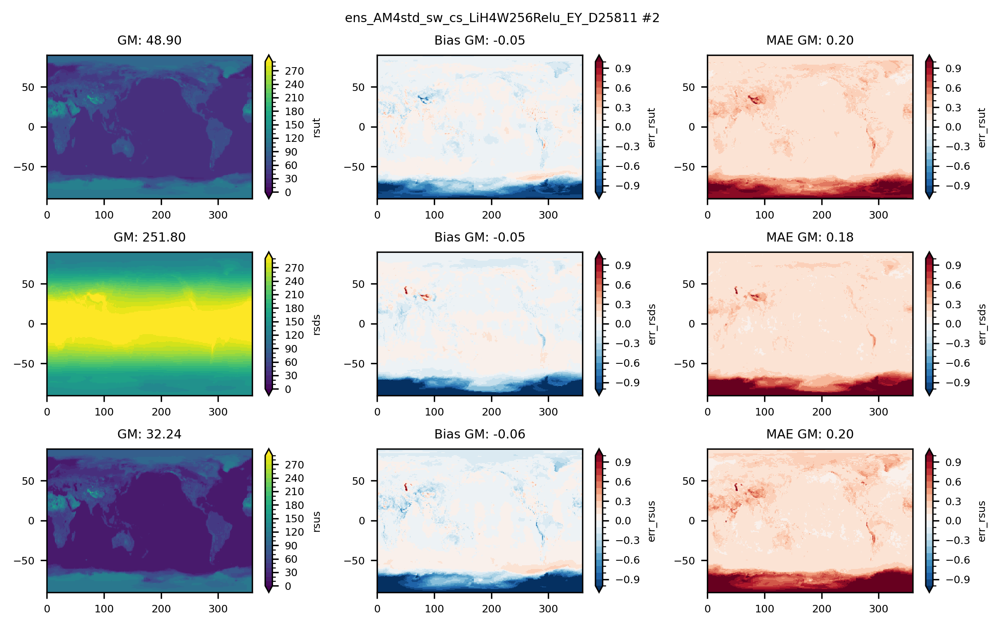

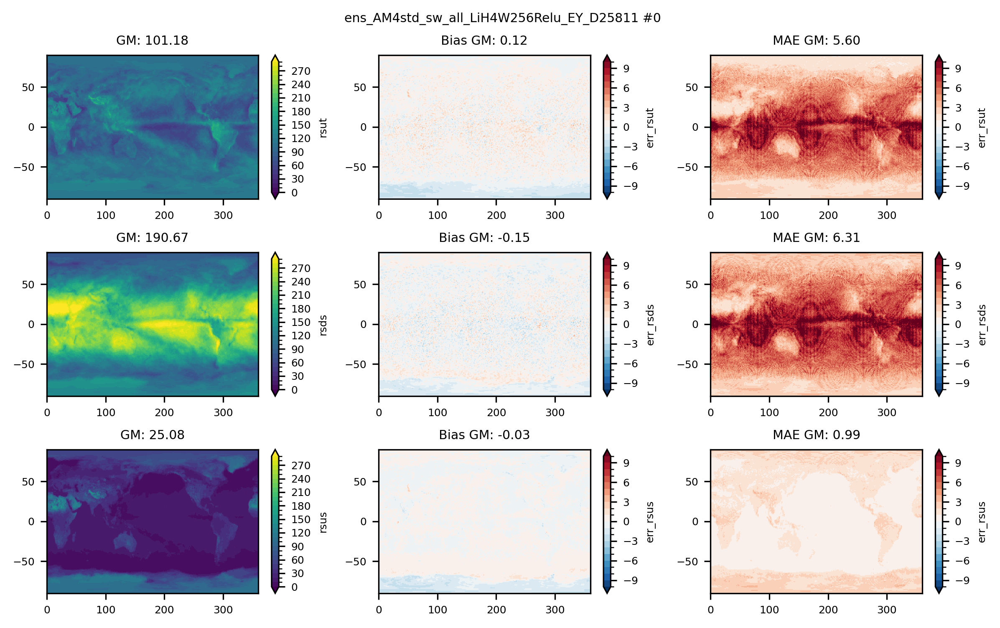

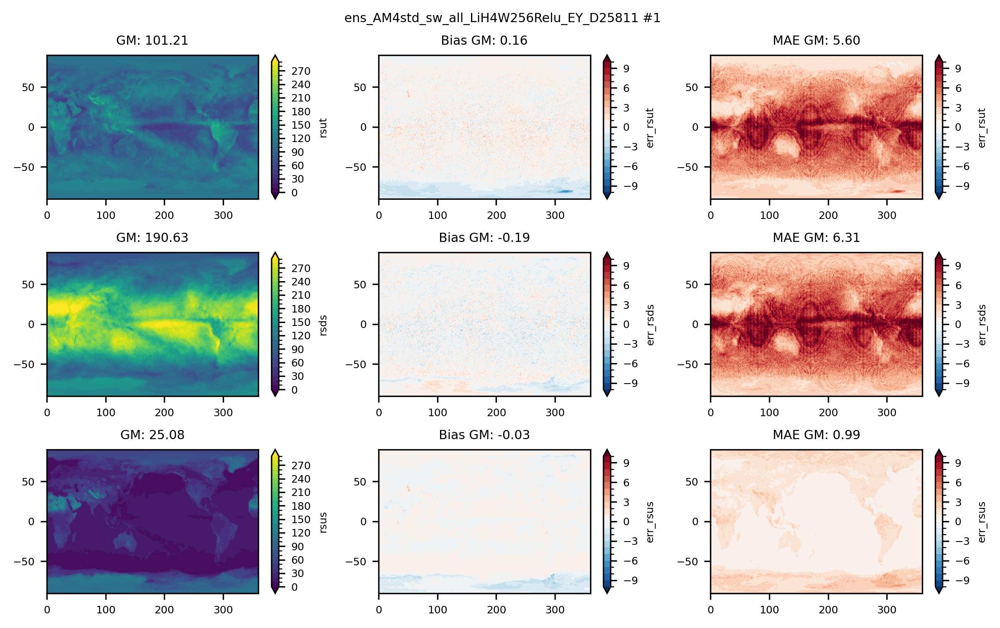

...

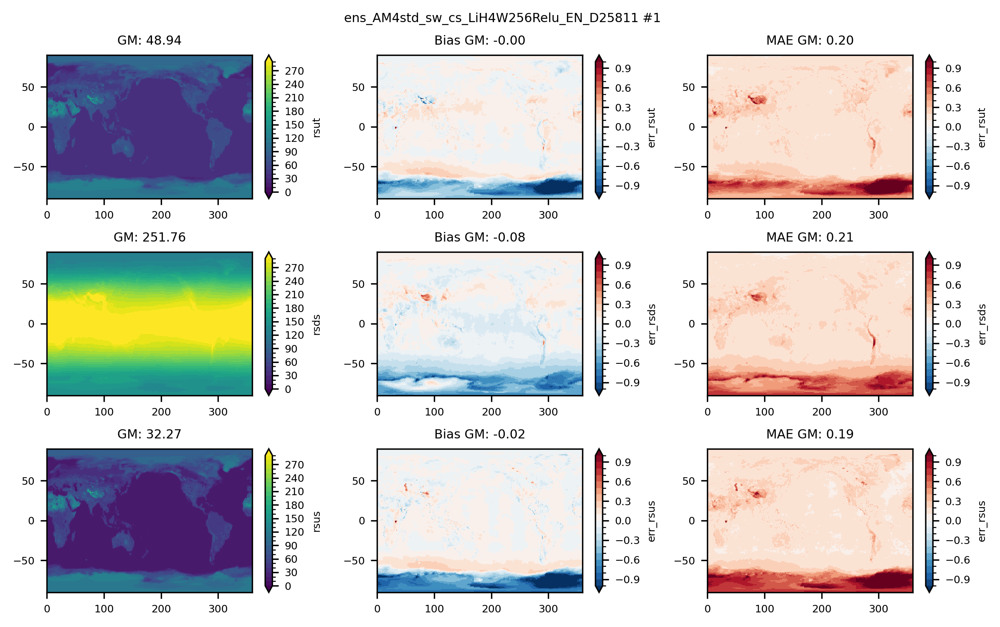

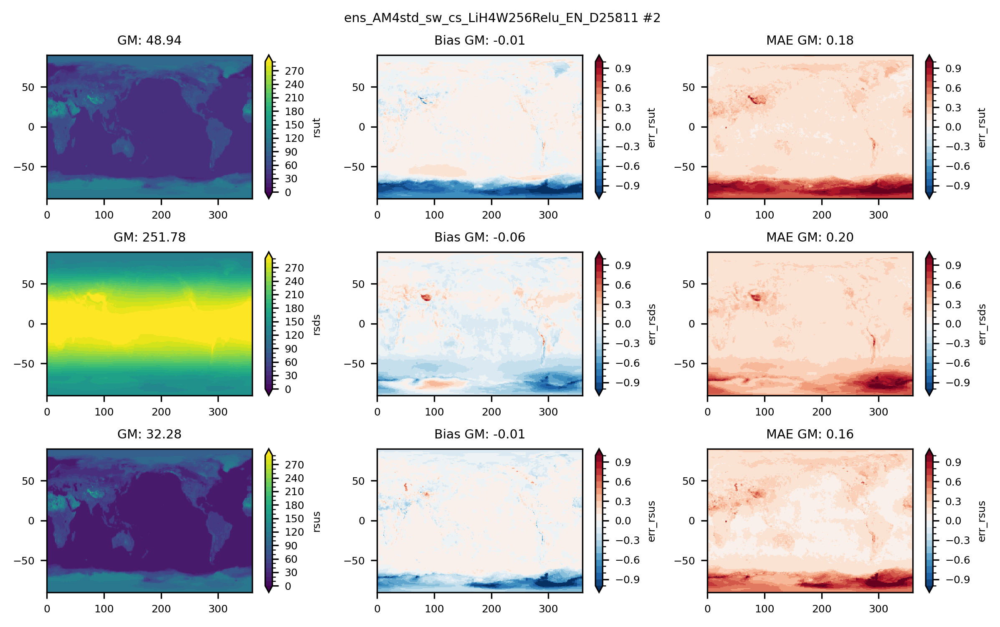

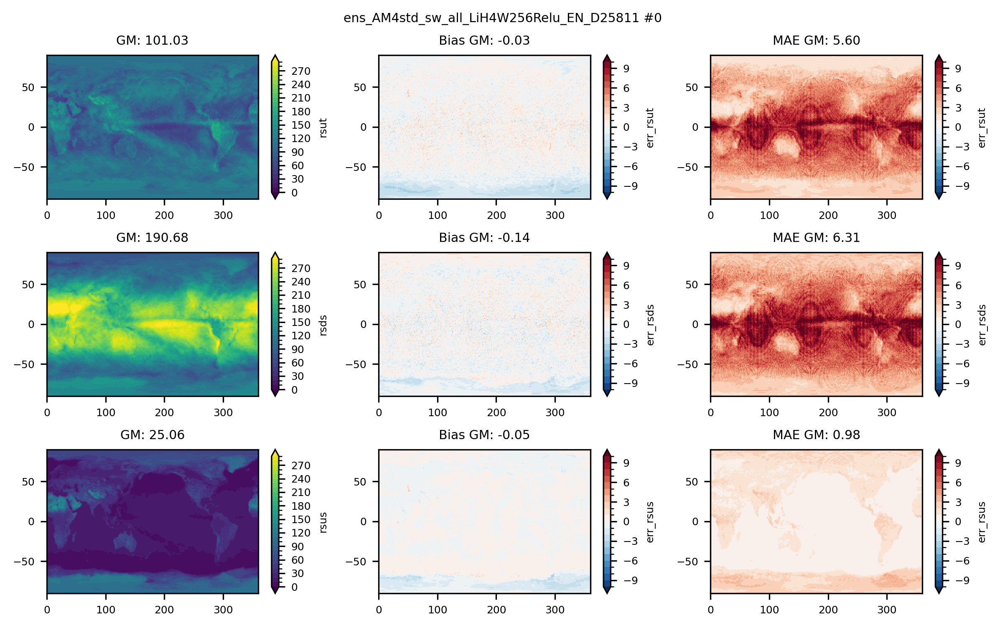

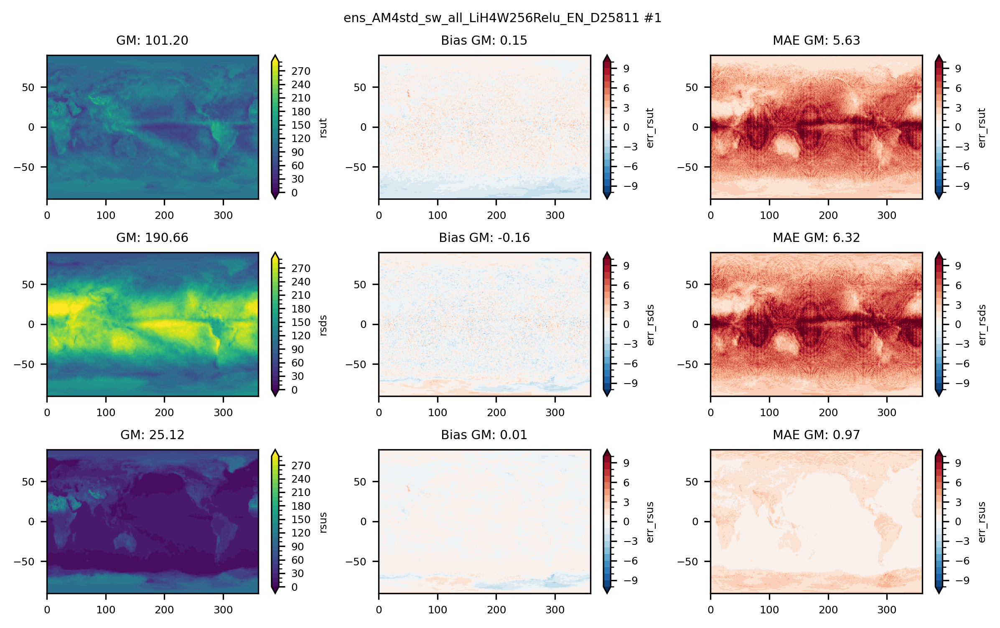

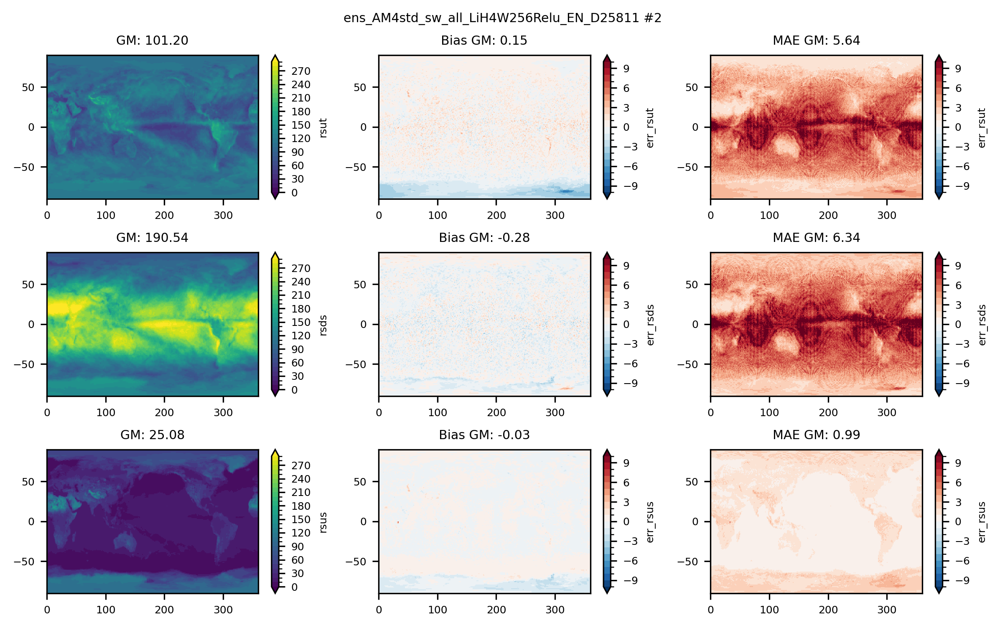

In [13]:
for mo in Exp_name:
    for ei in range(ensemble_size): 
        # time_sel = ds.time.dt.month.isin(month_sel)&ds.time.dt.day.isin(day_sel)
        # ds_plot = ds_regrid[mo][ei].isel(time=time_sel)
        ds_plot = ds_regrid[mo][ei]
        fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(8,5),dpi=300)
        axs = axs.flatten()
        var1 = ['rsut','rsds','rsus']
        for i in range(len(var1)):
            level = np.arange(0,300,10)
            ax=axs[3*i]
            da = ds_plot[var1[i]].mean('time')
            da.plot(ax=ax, levels=level, extend='both') 
            ax.set_title(f'GM: {global_mean_xarray(da).values:4.2f}')
            # level for error
            # level = np.array([-16, -8, -4,-2,-1,-0.5,-0.2,0,0.2,0.5,1,2,4,8,16])
            level = np.arange(-5,5.1,0.5)/5
            if sky_cond[mo] == 'all':  level = level*10
            ax=axs[3*i+1]
            da = ds_plot['err_'+var1[i]].mean('time')
            da.plot(ax=ax, levels=level, extend='both')   
            ax.set_title(f'Bias GM: {global_mean_xarray(da).values:4.2f}')
                         # +f'\n lat>-60: {global_mean_xarray(da.sel(lat=slice(-60,90))).values:4.2f}') 
            ax=axs[3*i+2]
            da = abs(ds_plot['err_'+var1[i]]).mean('time')
            da.plot(ax=ax, levels=level, extend='both')   
            ax.set_title(f'MAE GM: {global_mean_xarray(da).values:4.2f}')
                         # +f'\n lat>-60: {global_mean_xarray(da.sel(lat=slice(-60,90))).values:4.2f}') 
        for ax in axs:
            ax.set(xlabel=None,ylabel=None)
        plt.suptitle(f'{mo} #{ei}')
        fig.tight_layout()

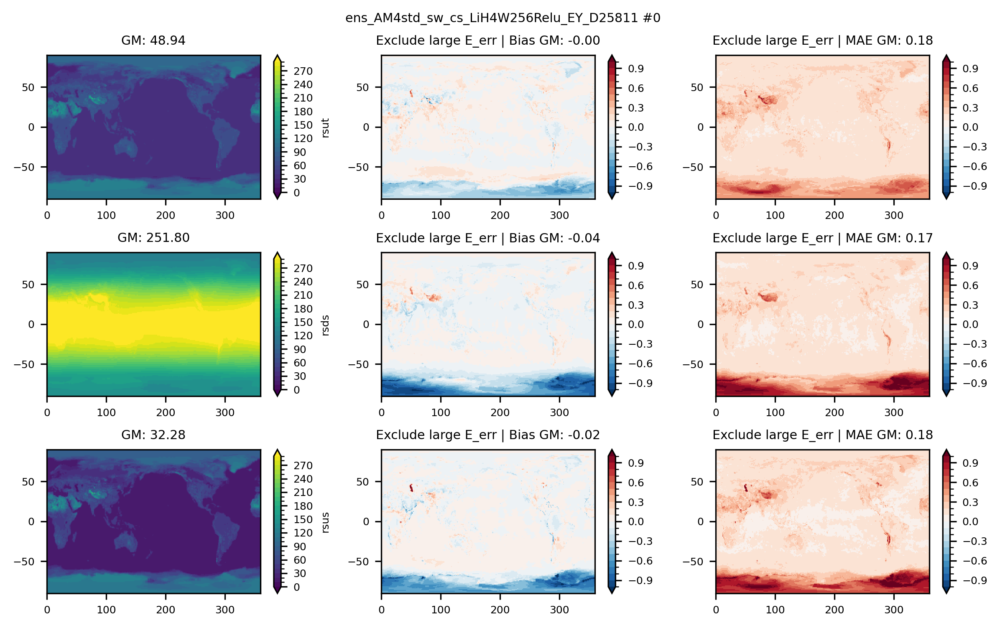

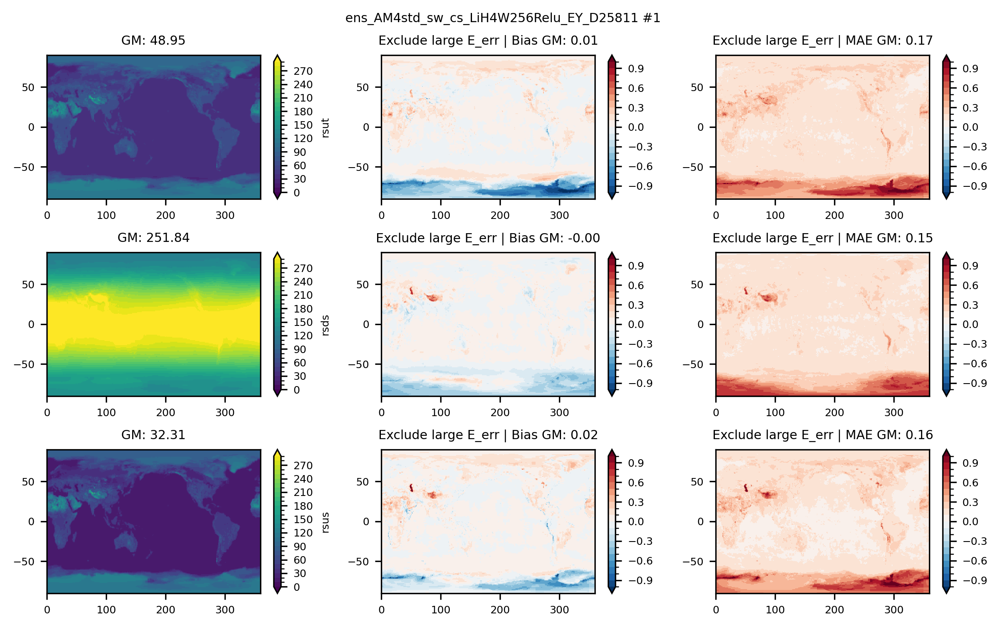

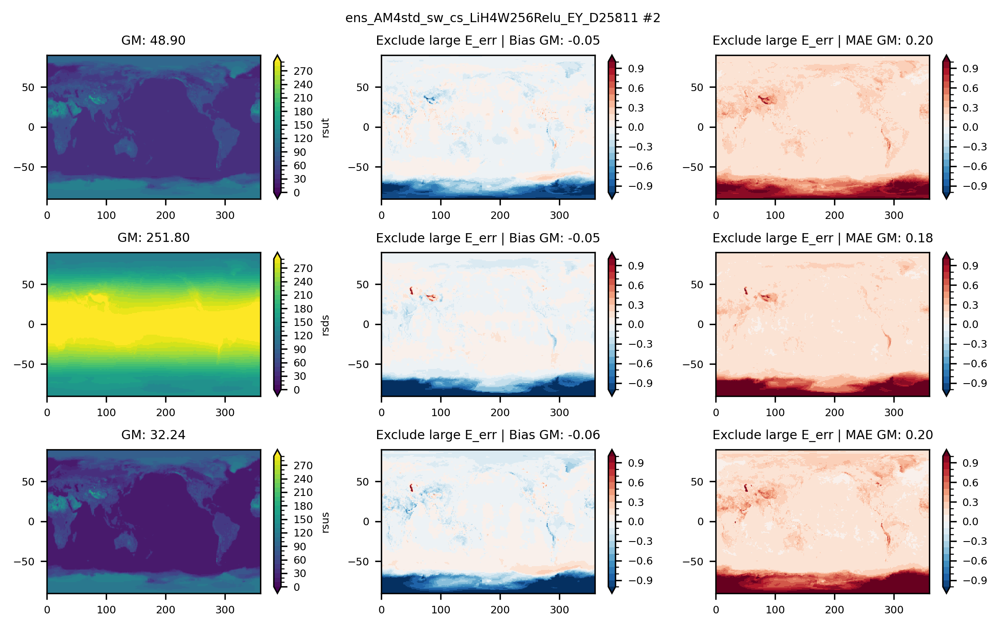

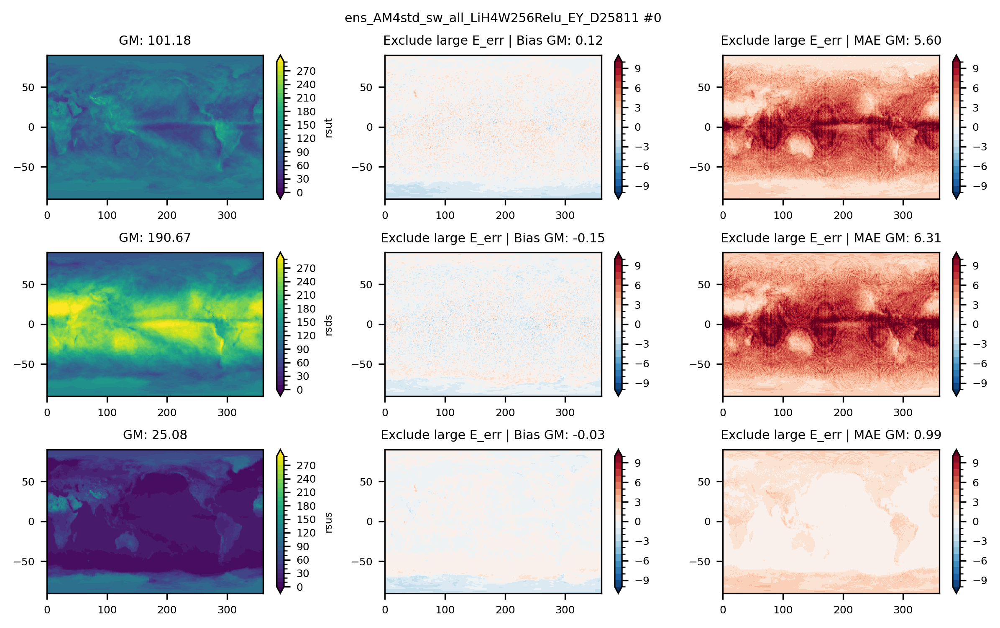

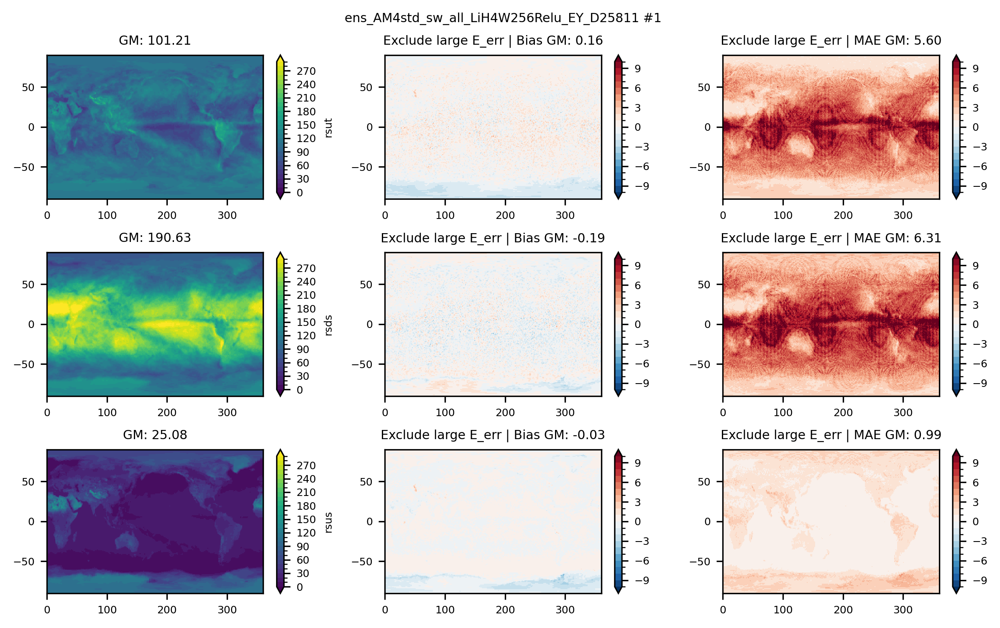

...

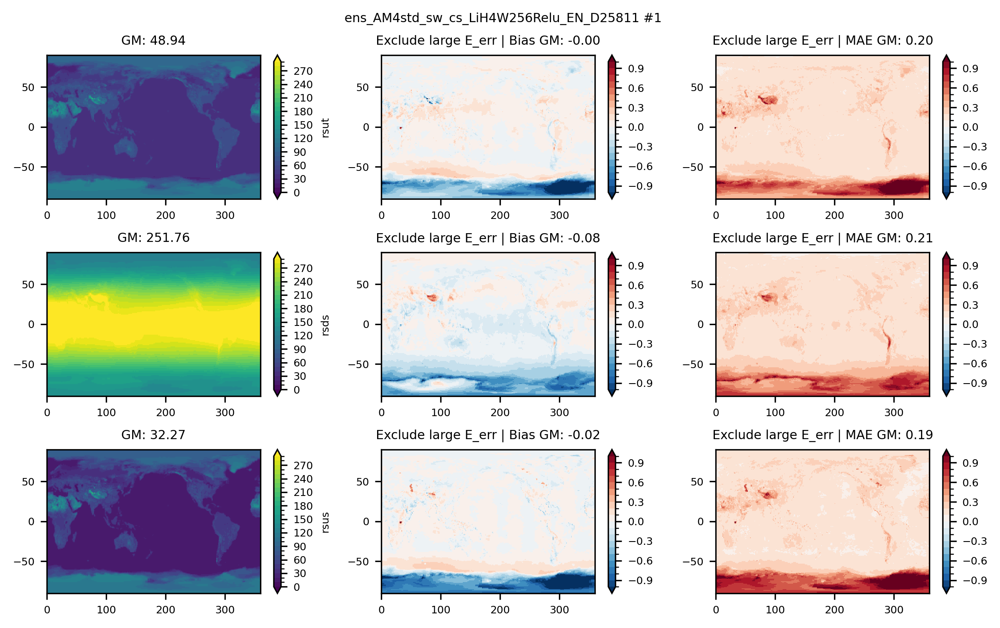

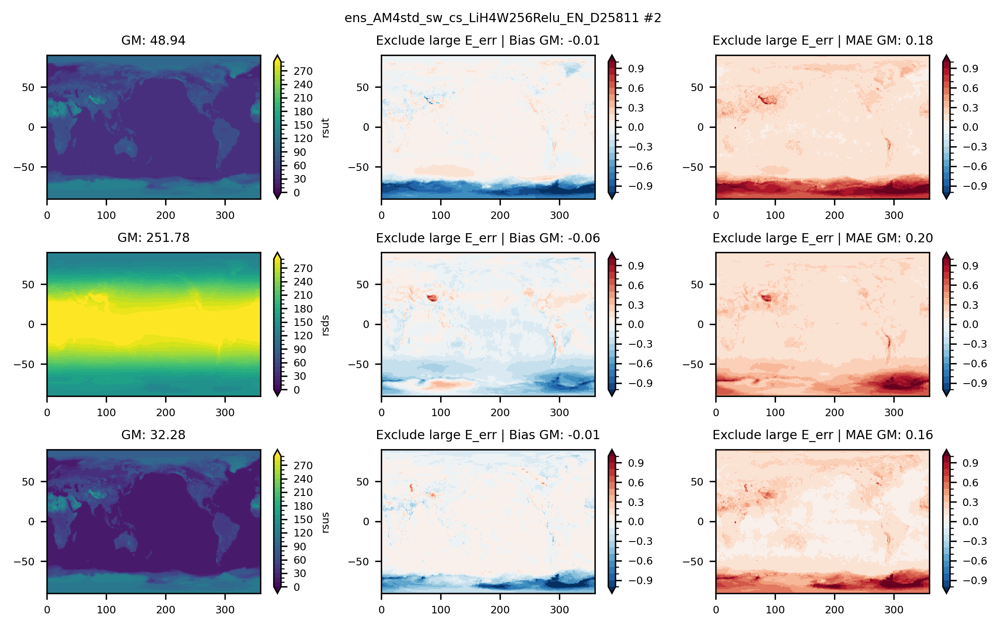

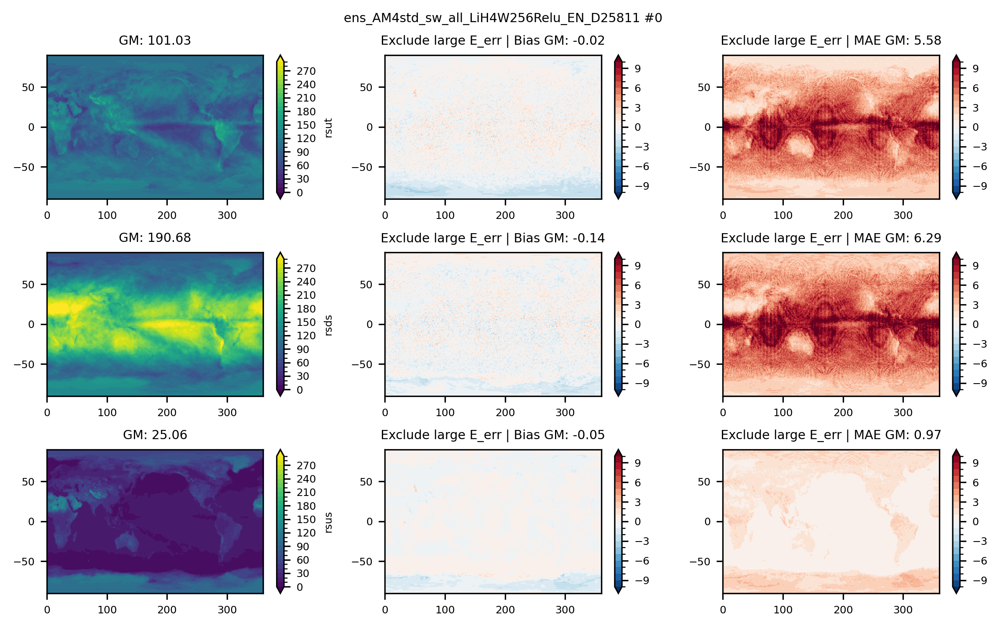

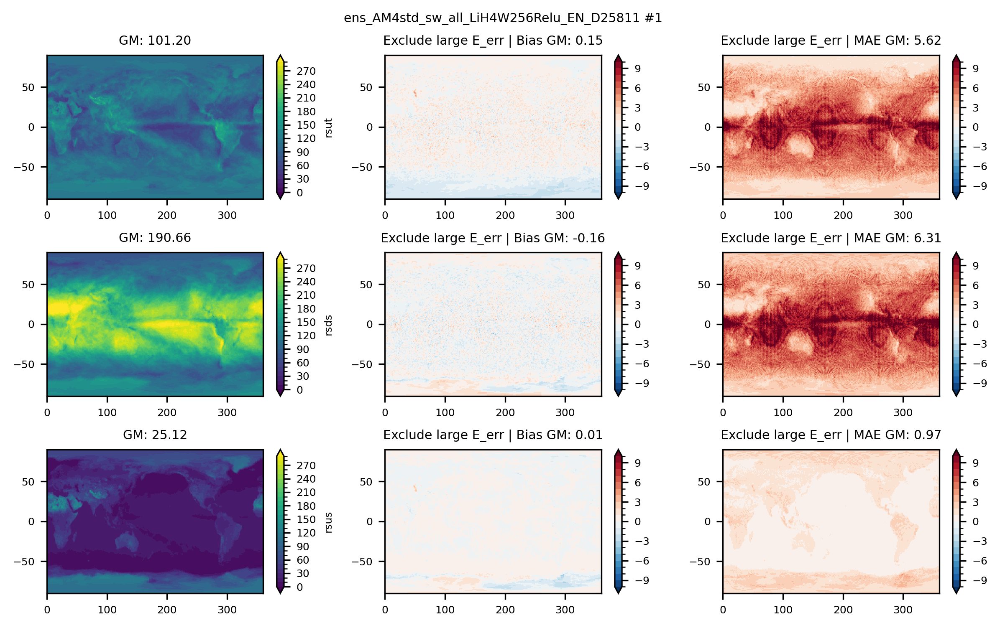

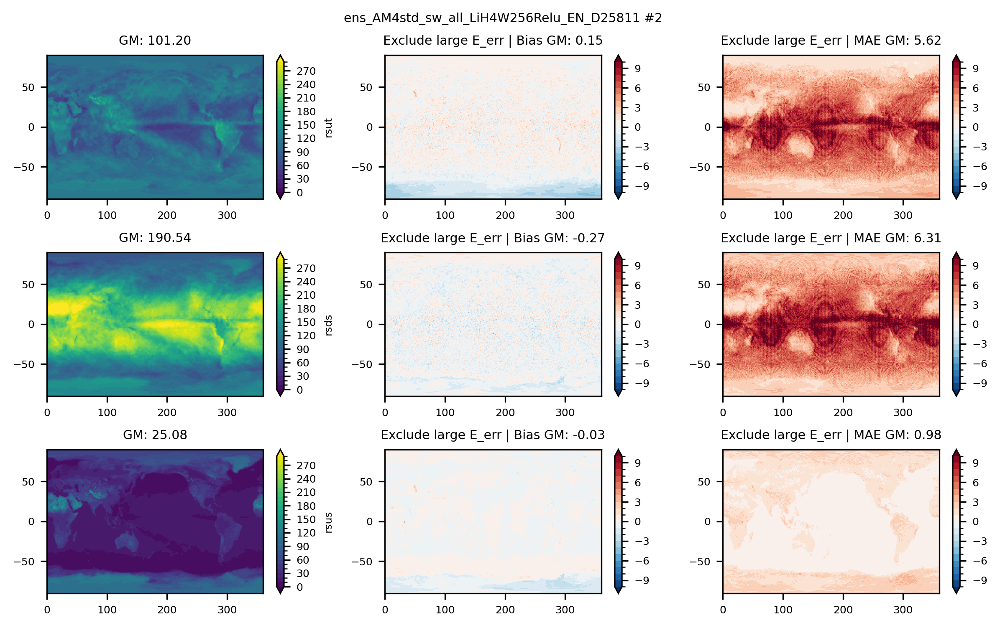

In [14]:
for mo in Exp_name:
    for ei in range(ensemble_size): 
        # time_sel = ds.time.dt.month.isin(month_sel)&ds.time.dt.day.isin(day_sel)
        # ds_plot = ds_regrid[mo][ei].isel(time=time_sel)
        ds_plot = ds_regrid[mo][ei]
        fig, axs = plt.subplots(nrows=3,ncols=3,figsize=(8,5),dpi=300)
        axs = axs.flatten()
        var1 = ['rsut','rsds','rsus']
        for i in range(len(var1)):
            level = np.arange(0,300,10)
            ax=axs[3*i]
            da = ds_plot[var1[i]].mean('time')
            da.plot(ax=ax, levels=level, extend='both') 
            ax.set_title(f'GM: {global_mean_xarray(da).values:4.2f}')
            # level for error
            # level = np.array([-16, -8, -4,-2,-1,-0.5,-0.2,0,0.2,0.5,1,2,4,8,16])
            level = np.arange(-5,5.1,0.5)/5
            if sky_cond[mo] == 'all':  level = level*10
            ax=axs[3*i+1]
            da_adj = xr.where(abs(ds_plot['err_eng'])<10, ds_plot['err_'+var1[i]], 0)
            da = da_adj.mean('time')
            da.plot(ax=ax, levels=level, extend='both')   
            ax.set_title(f'Exclude large E_err | Bias GM: {global_mean_xarray(da).values:4.2f}')
                         # +f'\n lat>-60: {global_mean_xarray(da.sel(lat=slice(-60,90))).values:4.2f}') 
            ax=axs[3*i+2]
            da = abs(da_adj).mean('time') 
            da.plot(ax=ax, levels=level, extend='both')   
            ax.set_title(f'Exclude large E_err | MAE GM: {global_mean_xarray(da).values:4.2f}')
                         # +f'\n lat>-60: {global_mean_xarray(da.sel(lat=slice(-60,90))).values:4.2f}') 
        for ax in axs:
            ax.set(xlabel=None,ylabel=None)
        plt.suptitle(f'{mo} #{ei}')
        fig.tight_layout()

# ERROR index on GM

In [15]:
print('GM: Bias, MAE, RMSE')
for mo in Exp_name:
    for ei in range(ensemble_size): 
        print(f'{mo} #{ei}')
        ds_plot = ds_regrid[mo][ei]
        for i in range(len(var1)): 
            da = global_mean_xarray(ds_plot['err_'+var1[i]])
            Bias = da.mean()
            MAE  = abs(da).mean()
            RMSE = ((da**2).mean())**0.5
            print(f'err_{var1[i]}: {Bias.values:4.2f}, {MAE.values:4.2f}, {RMSE.values:4.2f},') 

GM: Bias, MAE, RMSE
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811 #0
err_rsut: -0.00, 0.01, 0.02,
err_rsds: -0.04, 0.04, 0.06,
err_rsus: -0.02, 0.03, 0.04,
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811 #1
err_rsut: 0.01, 0.03, 0.03,
err_rsds: -0.00, 0.02, 0.03,
err_rsus: 0.02, 0.03, 0.04,
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811 #2
err_rsut: -0.05, 0.05, 0.06,
err_rsds: -0.05, 0.05, 0.07,
err_rsus: -0.06, 0.06, 0.07,
ens_AM4std_sw_all_LiH4W256Relu_EY_D25811 #0
err_rsut: 0.12, 0.14, 0.17,
err_rsds: -0.15, 0.17, 0.21,
err_rsus: -0.03, 0.05, 0.06,
ens_AM4std_sw_all_LiH4W256Relu_EY_D25811 #1
err_rsut: 0.16, 0.19, 0.23,
err_rsds: -0.19, 0.21, 0.24,
err_rsus: -0.03, 0.06, 0.08,
ens_AM4std_sw_all_LiH4W256Relu_EY_D25811 #2
err_rsut: 0.31, 0.31, 0.33,
err_rsds: -0.28, 0.28, 0.31,
err_rsus: 0.01, 0.04, 0.05,
ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811 #0
err_rsut: -0.04, 0.04, 0.05,
err_rsds: -0.09, 0.10, 0.12,
err_rsus: -0.07, 0.07, 0.08,
ens_AM4std_sw_cs_LiH4W256Relu_EN_D25811 #1
err_rsut: -0.00, 0.03, 0.04,
e

## plot error for all columns

In [16]:
z_lev = [ 1.      ,    4.      ,    8.186021,   13.788865,   20.917952,
         29.836408,   41.217896,   55.792215,   74.201906,   97.047864,
        124.966648,  158.549553,  198.396959,  245.027221,  298.888576,
        360.040179,  427.458025,  498.243573,  568.220535,  633.836047,
        693.266329,  745.991986,  792.097373,  831.921945,  865.977814,
        894.872525,  919.22792 ,  939.565932,  956.402132,  970.147661,
        981.130665,  989.68    ,  995.9     ,  1000.     ]

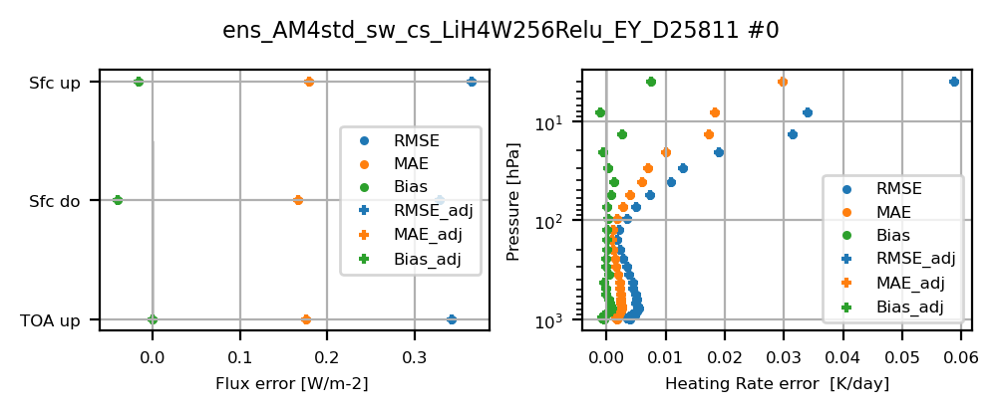

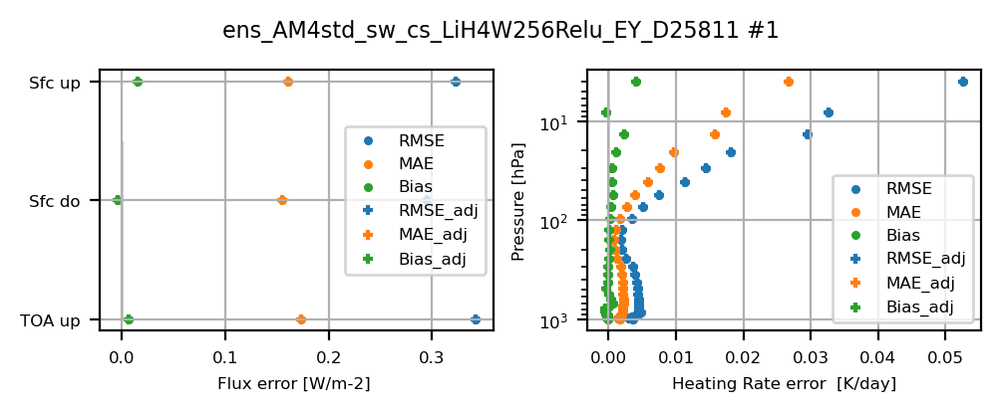

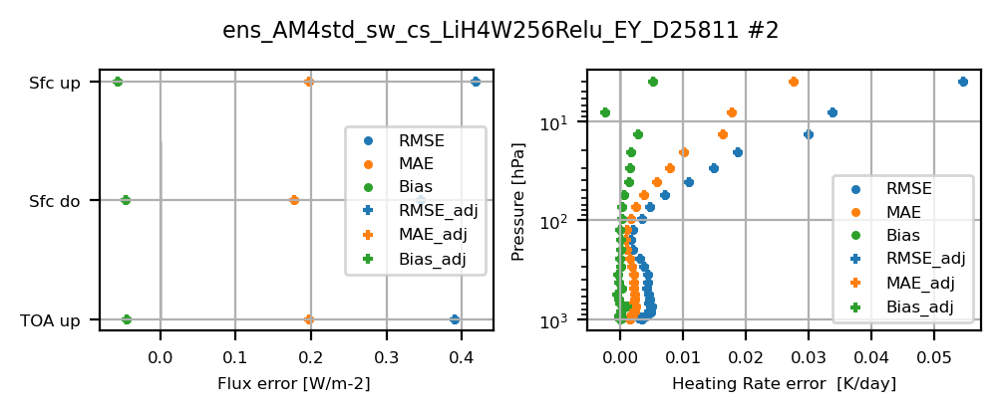

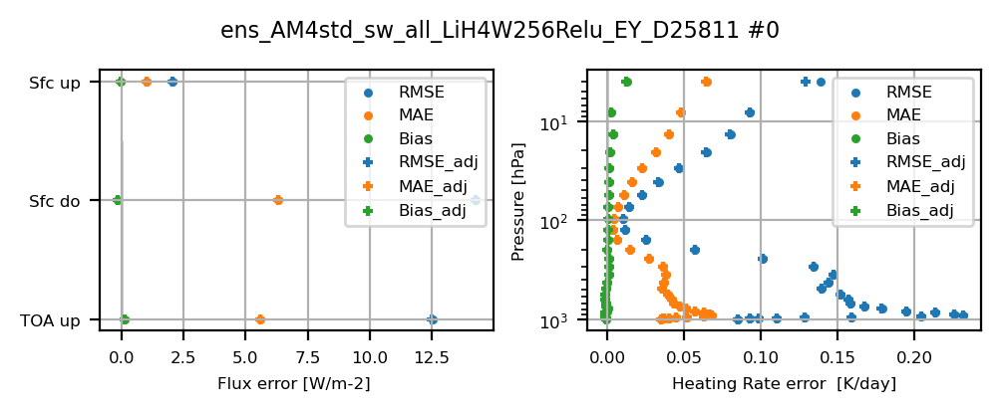

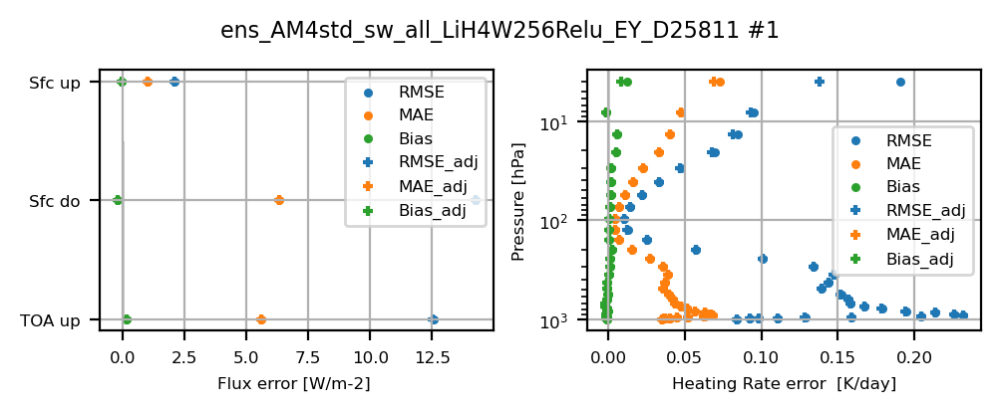

...

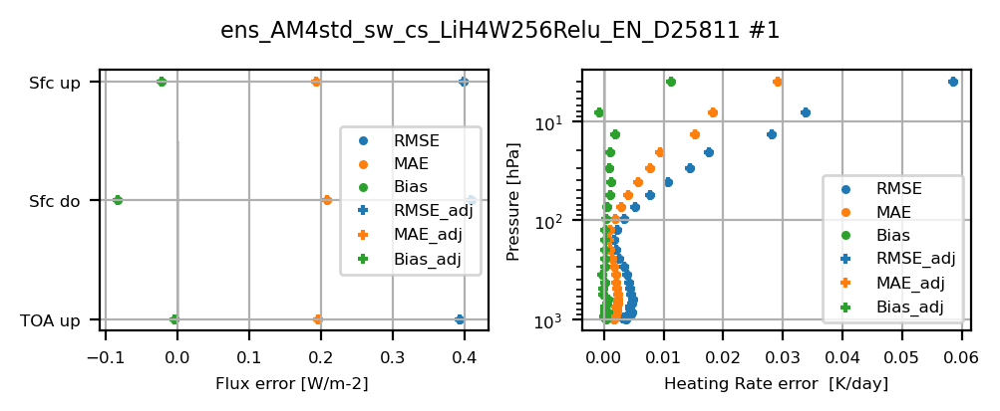

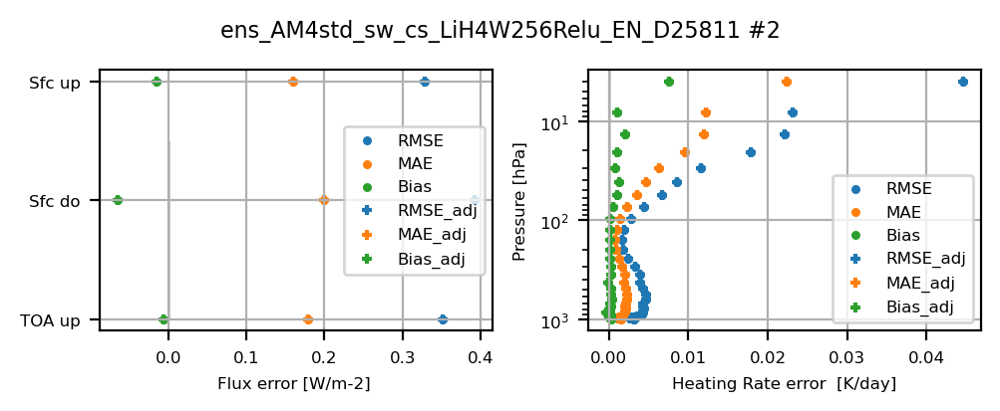

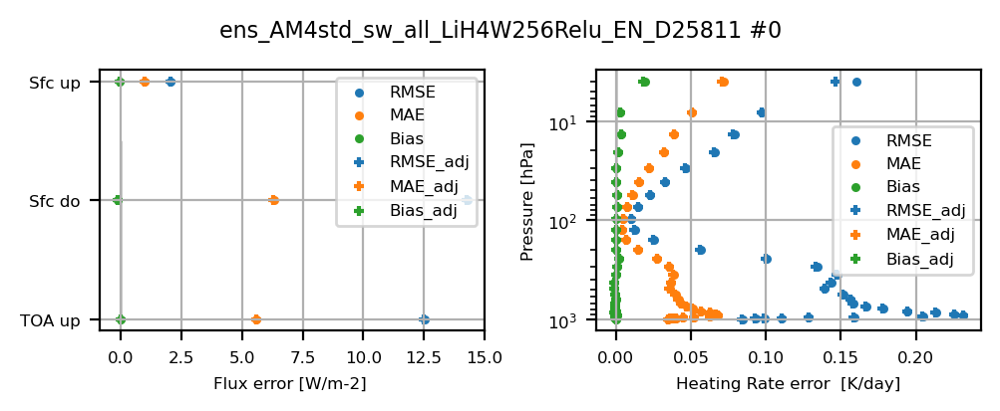

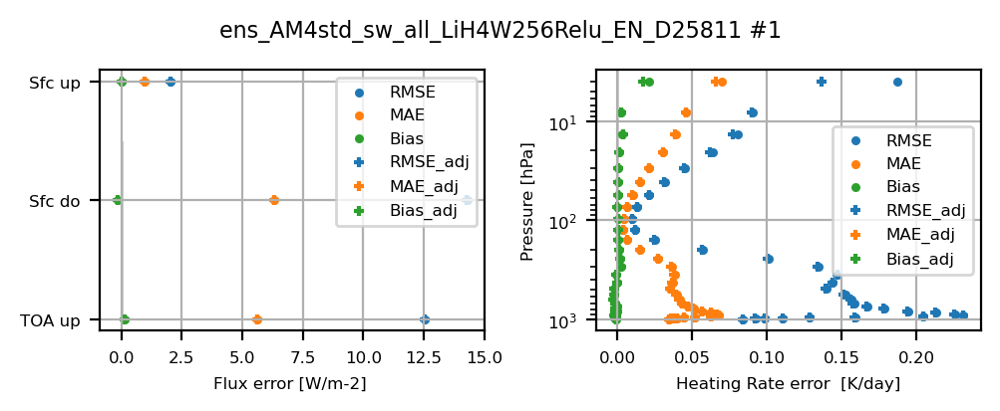

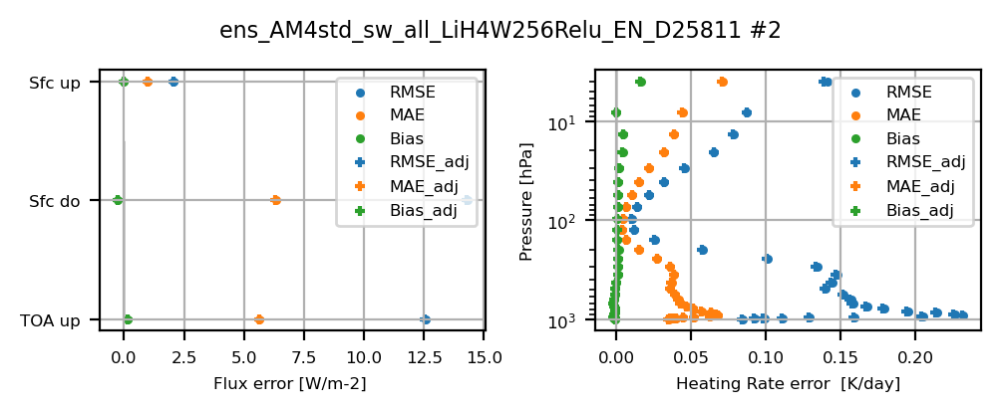

In [17]:
for i, mo in enumerate(Exp_name):
    for ei in range(ensemble_size): 
        RMSE = []
        MAE  = []
        Bias = []
        RMSE_adj = []
        MAE_adj  = []
        Bias_adj = []
        ds = ds_regrid[mo][ei]  
        rsut_nn = ds['rsut'].stack(txy=("time", "lat", "lon")).values
        rsut = rsut_nn-ds['err_rsut'].stack(txy=("time", "lat", "lon")).values
        err_var = [ 'err_rsut','err_rsds','err_rsus','err_tntrs' ]  
        for i in range(len(err_var)): 
            da = ds[err_var[i]].mean('time')
            Bias.append(global_mean_xarray(da).values) 
            da = abs(ds[err_var[i]]).mean('time')
            MAE .append(global_mean_xarray(da).values) 
            da = ((ds[err_var[i]]**2).mean('time'))**0.5
            RMSE.append(global_mean_xarray(da).values) 
            da_adj = xr.where(abs(ds['err_eng'])<10, ds[err_var[i]], 0)
            da = da_adj.mean('time') 
            Bias_adj.append(global_mean_xarray(da).values) 
            da = abs(da_adj).mean('time')
            MAE_adj .append(global_mean_xarray(da).values) 
            da = ((da_adj**2).mean('time'))**0.5
            RMSE_adj.append(global_mean_xarray(da).values) 
        # plt.style.use('_mpl-gallery')
        fig, axs = plt.subplots(nrows=1, ncols=2, figsize=(5,2),dpi=200) 
        axs=axs.flatten() 
        ax3=axs[0] # error
        ax4=axs[1] # error 

        ax3.set_prop_cycle(None)
        ax3.scatter(RMSE[:3], np.arange(3),  s=5, label='RMSE')
        ax3.scatter(MAE [:3], np.arange(3),  s=5, label='MAE' )
        ax3.scatter(Bias[:3], np.arange(3),  s=5, label='Bias')
        ax3.set_prop_cycle(None)
        ax3.scatter(RMSE_adj[:3], np.arange(3),  s=15, marker='+', label='RMSE_adj')
        ax3.scatter(MAE_adj [:3], np.arange(3),  s=15, marker='+', label='MAE_adj')
        ax3.scatter(Bias_adj[:3], np.arange(3),  s=15, marker='+', label='Bias_adj')
        ax3.plot([0,0],[0,1.5],c='k',linewidth = 0.5, zorder=0)
        ax3.set_yticks([0,1,2], labels=[ 'TOA up','Sfc do','Sfc up',])
        ax3.legend(fontsize=6)
        ax3.set_xlabel('Flux error [W/m-2] ')
        ax3.grid(True)
    #     ax3.set_xlim([-0.1,1.2])

        ax4.set_prop_cycle(None)
        ax4.scatter(RMSE[3:], z_lev[1:],  s=5, label='RMSE')
        ax4.scatter(MAE [3:], z_lev[1:],  s=5, label='MAE') 
        ax4.scatter(Bias[3:], z_lev[1:],  s=5, label='Bias')
        ax4.set_prop_cycle(None)
        ax4.scatter(RMSE_adj[3:], z_lev[1:],  s=15, marker='+', label='RMSE_adj')
        ax4.scatter(MAE_adj [3:], z_lev[1:],  s=15, marker='+', label='MAE_adj') 
        ax4.scatter(Bias_adj[3:], z_lev[1:],  s=15, marker='+', label='Bias_adj')
        ax4.plot([0,0],[0,1e3],c='k',linewidth = 0.5, zorder=0)
        ax4.legend(fontsize=6)
        ax4.invert_yaxis()
        ax4.set_yscale('log') 
        ax4.grid(True)
    #     ax4.set_xlim([-0.04,0.4])
        ax4.set_xlabel('Heating Rate error  [K/day]')
        ax4.set_ylabel('Pressure [hPa]') 
        plt.suptitle(f'{mo} #{ei}',fontsize=8)
        fig.tight_layout()
        fig.show() 

# energy check

In [18]:
std_nor_vars_name  = [ 'rsut','rsds','rsus','tntrs' ]  
std_nor_vars_gn = {}
err_vars_name = ['err_eng', 'err_rsut','err_rsds','err_rsus','err_tntrs' ]  
err_vars_gn = {}  
for mo in Exp_name: 
    err_vars_gn[mo] = []
    std_nor_vars_gn[mo] = []
    for ei in range(ensemble_size):
        err_ei_dict = {}
        var_ei_dict = {}
        run_num, exp_dir = return_exp_dir(work_dir, mo, create_dir=False)
        NN_output_name = f'NN_{ei}_20000101.fluxes' 
        for var in err_vars_name:
            err_ei_dict[var] = []
        for var in std_nor_vars_name:
            var_ei_dict[var] = []
        for ti in range(1,7):
            tile_file_path = exp_dir+f'/NN_pred/{NN_output_name}.tile{ti}.nc'
            print(tile_file_path)
            # open regridded file
            with  xr.open_dataset(tile_file_path) as ds:
                rsut_true = ds['rsut'].stack(txy=("time","grid_yt", "grid_xt")).values.T \
                          - ds['err_rsut'].stack(txy=("time","grid_yt", "grid_xt")).values.T
                day_ind = np.argwhere(~np.isclose(rsut_true,0, atol=1e-1)).squeeze()
                for var in err_vars_name: 
                    err_ei_dict[var].append(ds[var].stack(txy=("time","grid_yt", "grid_xt")).values.T[day_ind]) 
                for var in std_nor_vars_name:
                    var_ei_dict[var].append(ds[var].stack(txy=("time","grid_yt", "grid_xt")).values.T[day_ind]) 
        for var in err_vars_name:
            err_ei_dict[var] = np.concatenate(err_ei_dict[var]) 
        for var in std_nor_vars_name:
            var_ei_dict[var] = np.concatenate(var_ei_dict[var])
        err_vars_gn[mo].append(err_ei_dict)
        std = np.concatenate([np.atleast_1d(var_ei_dict[var].std(axis=0))  for var in std_nor_vars_name])
        std_nor_vars_gn[mo].append(std) 

/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.tile1.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.tile2.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.tile3.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.tile4.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.tile5.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_0_20000101.fluxes.tile6.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_1_20000101.fluxes.tile1.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_pred/NN_1_20000101.fluxes.tile2.nc
/tigress/cw55/work/2022_radi_nn/work/ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811/NN_

## exclude large energe error columns

In [19]:
for i, mo in enumerate(Exp_name): 
    for ei in range(ensemble_size): 
        err_eng_arr = err_vars_gn[mo][ei]['err_eng']
        ind_small_eng_err = np.argwhere(abs(err_eng_arr)<2)
        print(f"{mo} #{ei} good ratio: {ind_small_eng_err.size/err_eng_arr.size:4.2f}")
        rd_id_more = np.random.randint(0,ind_small_eng_err.shape[0],1000000) 
        ind_small_eng_err = ind_small_eng_err[rd_id_more] 
        err_var_arr = np.stack([err_vars_gn[mo][ei]['err_rsut'],
                                err_vars_gn[mo][ei]['err_rsds'],
                                err_vars_gn[mo][ei]['err_rsus']])
        RMSE = ((err_var_arr[:,ind_small_eng_err]**2).mean(axis=1)).squeeze()**0.5
        MAE  = abs(err_var_arr[:,ind_small_eng_err]).mean(axis=1).squeeze()
        Bias = err_var_arr[:,ind_small_eng_err].mean(axis=1).squeeze()
        print('filtered',Bias[:2],MAE[:2],RMSE[:2])
        rd_id_more = np.random.randint(0,err_eng_arr.shape[0],1000000) 
        RMSE = ((err_var_arr[:,rd_id_more]**2).mean(axis=1))**0.5
        MAE  = abs(err_var_arr[:,rd_id_more]).mean(axis=1)
        Bias = err_var_arr[:,rd_id_more].mean(axis=1)
        print('raw     ',Bias[:2],MAE[:2],RMSE[:2])

ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811 #0 good ratio: 1.00
filtered [ 0.00165988 -0.05246015] [0.31396496 0.2826706 ] [0.54397345 0.5639606 ]
raw      [ 0.00162246 -0.05297912] [0.3156741  0.28328645] [0.55059505 0.5700118 ]
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811 #1 good ratio: 1.00
filtered [ 0.01351119 -0.00038865] [0.30580604 0.26484928] [0.558274   0.45977482]
raw      [0.01334524 0.0004771 ] [0.3056774  0.26512814] [0.55718076 0.46144268]
ens_AM4std_sw_cs_LiH4W256Relu_EY_D25811 #2 good ratio: 1.00
filtered [-0.05670923 -0.0464405 ] [0.33733058 0.28741753] [0.6106026 0.5433691]
raw      [-0.06523994 -0.0571186 ] [0.3455829  0.29756013] [0.65419346 0.6091397 ]
ens_AM4std_sw_all_LiH4W256Relu_EY_D25811 #0 good ratio: 1.00
filtered [ 0.27004835 -0.26204216] [14.123347 15.923645] [27.627104 31.09197 ]
raw      [ 0.23505276 -0.24805295] [14.123456 15.927667] [27.664148 31.15357 ]
ens_AM4std_sw_all_LiH4W256Relu_EY_D25811 #1 good ratio: 1.00
filtered [ 0.31476805 -0.3486841 ] [14.156402 

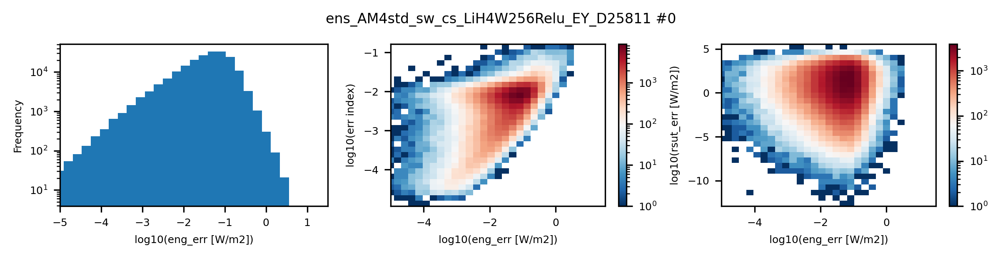

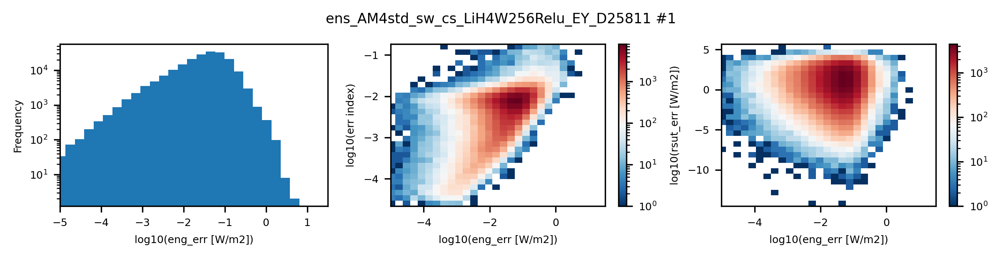

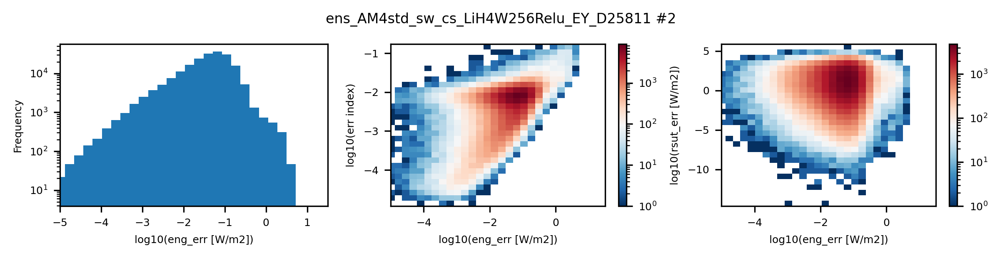

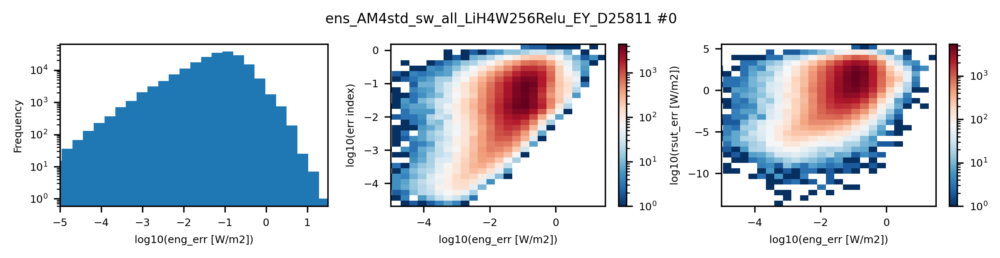

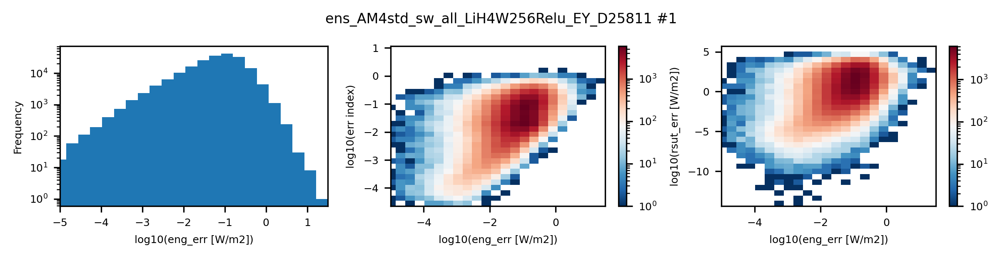

...

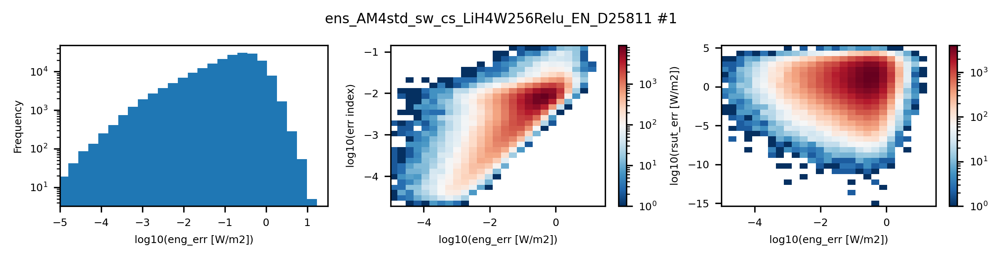

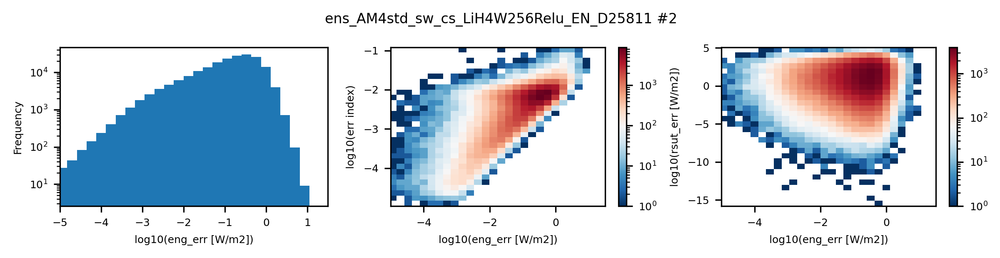

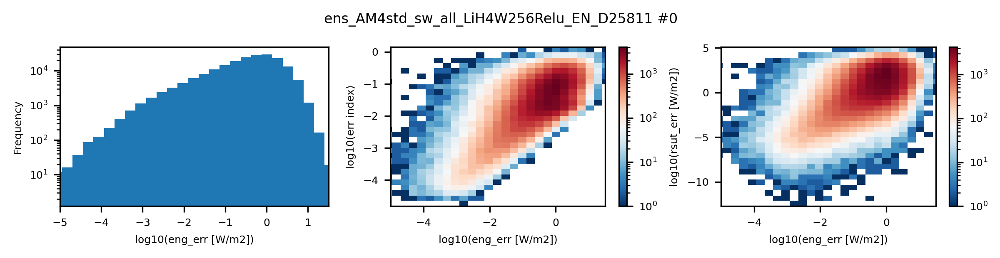

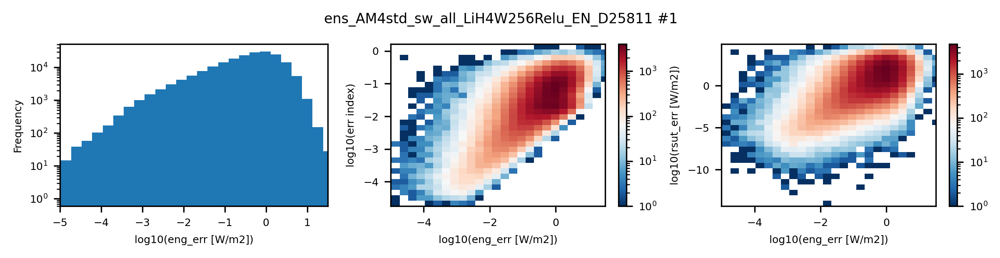

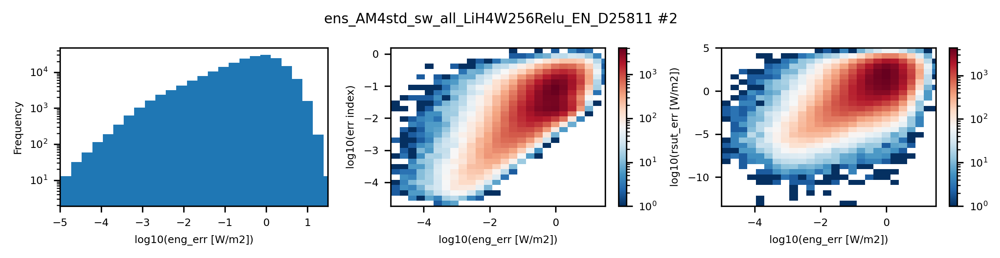

In [20]:
for i, mo in enumerate(Exp_name):  
    for ei in range(ensemble_size):
        err_eng_arr = err_vars_gn[mo][ei]['err_eng']  

        std_nor = std_nor_vars_gn[mo][ei]
        err_var_all = np.concatenate([np.atleast_2d(err_vars_gn[mo][ei][var].T)  for var in err_vars_name[1:]],axis=0)
        pred_err_ind = abs(err_var_all/std_nor[:,None]).mean(axis=0)
        
        rd_id_more = np.random.randint(0,err_eng_arr.size,200000)
        fig, axs = plt.subplots(nrows=1, ncols=3, figsize=(8,2),dpi=300, tight_layout=True) 
        axs= axs.flatten()
        ax = axs[0]
        eng_err_log = np.log(abs(err_eng_arr[rd_id_more])+1e-6)/np.log(10)
        pred_err_ind_log = np.log(abs(pred_err_ind[rd_id_more])+1e-6)/np.log(10)
        ax.hist(eng_err_log,bins=30)
        ax.set_yscale('log')
        ax.set_xlim([-5,1.5])
        ax.set_xlabel('log10(eng_err [W/m2])')
        ax.set_ylabel('Frequency')
        ax = axs[1]
        h=ax.hist2d(eng_err_log,pred_err_ind_log, bins=30,
                    norm=colors.LogNorm(),
                    cmap='RdBu_r') 
        fig.colorbar(h[3], ax=ax)
        ax.set_xlim([-5,1.5])
        ax.set_xlabel('log10(eng_err [W/m2])')
        ax.set_ylabel('log10(err index)')
        ax = axs[2]
        h=ax.hist2d(eng_err_log,np.log(abs(err_var_arr[0,rd_id_more]+1e-6)/np.log(10)),
                   bins=30, 
                    norm=colors.LogNorm(),
                    cmap='RdBu_r') 
        fig.colorbar(h[3], ax=ax)
        ax.set_xlim([-5,1.5])
        ax.set_xlabel('log10(eng_err [W/m2])')
        ax.set_ylabel('log10(rsut_err [W/m2])')
        plt.suptitle(f'{mo} #{ei}',fontsize=8) 
        fig.show()